In [27]:
import pandas as pd
import numpy as np
import seaborn as sns

In [28]:
#Set viewing options
pd.set_option('display.max_columns', None)  
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_colwidth', None)

In [29]:
# Read in data
trainlabel = pd.read_csv('data/train_10pct_labels.csv')

In [30]:
train = pd.read_csv('data/train_10pct.csv')

In [32]:
# Merge independent, dependent variable datasets
profile_train = pd.merge(train,trainlabel)

In [33]:
profile_train.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,802906,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,28830,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,94947,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,590882,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,201944,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3


### Use Pandas Profiling package

In [ ]:
!pip install pandas_profiling 

In [34]:
from pandas_profiling import ProfileReport

In [36]:
profile = ProfileReport(profile_train, title='Report')
profile
# report generated

### Use Sweetviz package

In [37]:
!pip install sweetviz

In [38]:
import sweetviz as sv

my_report = sv.analyze(profile_train)
my_report.show_html() 
# report generated


Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### Create/plot target variable correlation datasets

<AxesSubplot:>

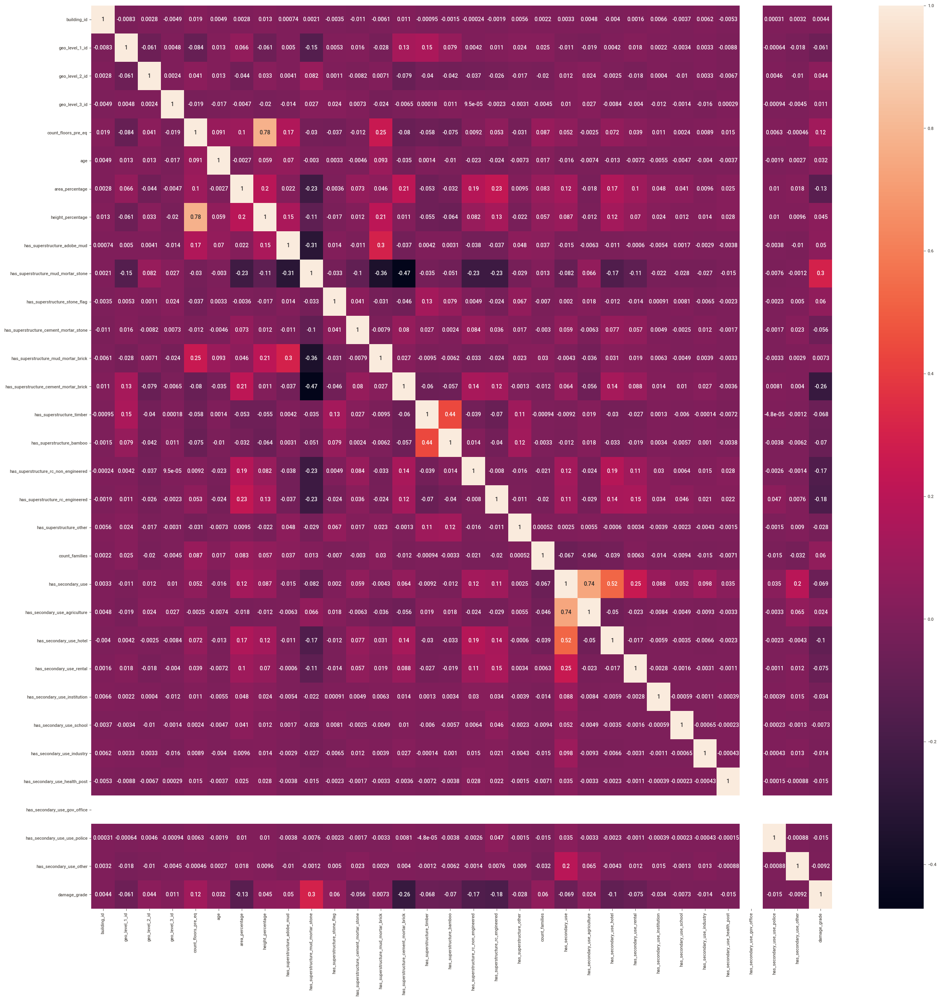

In [42]:
fig, ax = plt.subplots(figsize=(30,30))
sns.heatmap(profile_train.corr(), annot=True)

In [39]:
dmg_corr = pd.DataFrame([['geo_level_1_id', .13], ['geo_level_2_id', .05], 
                         ['geo_level_3_id', .02], ['age' , .04],
                    ['area_percentage', .14], ['height_percentage' , .05]], columns=['feature', 'correlation ratio'])
dmg_corr 

,feature,correlation ratio
0,geo_level_1_id,0.13
1,geo_level_2_id,0.05
2,geo_level_3_id,0.02
3,age,0.04
4,area_percentage,0.14
5,height_percentage,0.05


In [40]:
dmg_corr = dmg_corr.sort_values('correlation ratio', ascending=False)

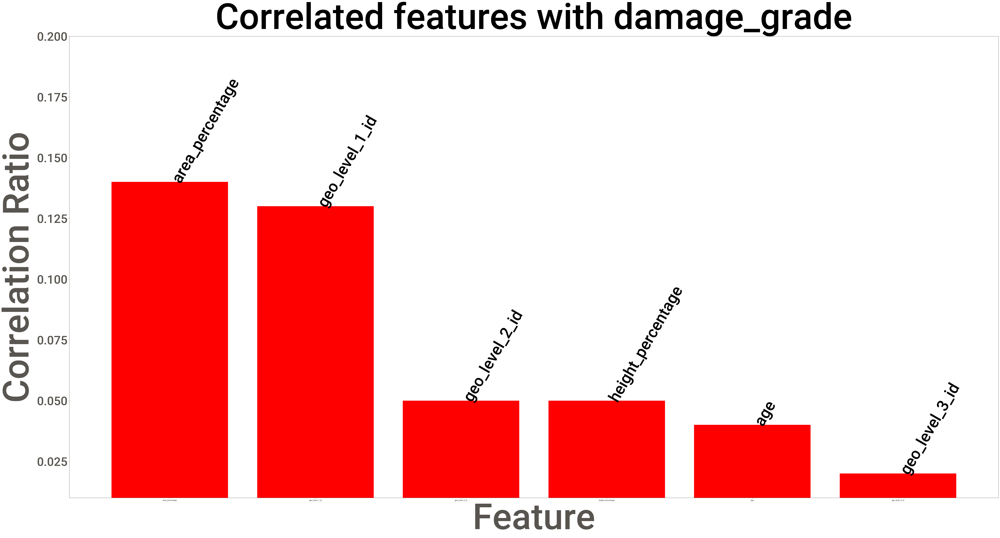

In [21]:
plt.figure(figsize=(10, 10))
plt.bar(dmg_corr['feature'], dmg_corr['correlation ratio'], color='red')
plt.ylim([.01,.20])
plt.yticks(fontsize=50)
for i in range(len(dmg_corr['correlation ratio'])):
    plt.text(x = dmg_corr['feature'][i], y = dmg_corr['correlation ratio'][i], s = dmg_corr['feature'][i], size = 66, rotation=60)
plt.subplots_adjust(top = 2.8, right = 5.5)
plt.title("Correlated features with damage_grade", fontsize=150)
plt.xlabel('Feature', fontsize=150)
plt.ylabel('Correlation Ratio', fontsize=150);

In [26]:
# Compared count_families to damage_grade
profile_train.groupby('count_families')['damage_grade'].value_counts(normalize=True)

count_families  damage_grade
0               2               0.539941
                3               0.279093
                1               0.180966
1               2               0.571839
                3               0.338087
                1               0.090074
2               2               0.545918
                3               0.384354
                1               0.069728
3               2               0.466258
                3               0.411043
                1               0.122699
4               2               0.500000
                3               0.392857
                1               0.107143
5               2               0.571429
                3               0.357143
                1               0.071429
6               1               0.500000
                3               0.500000
Name: damage_grade, dtype: float64